In [14]:
%matplotlib inline

import cv2
import json
import matplotlib.pyplot as plt
import numpy as np

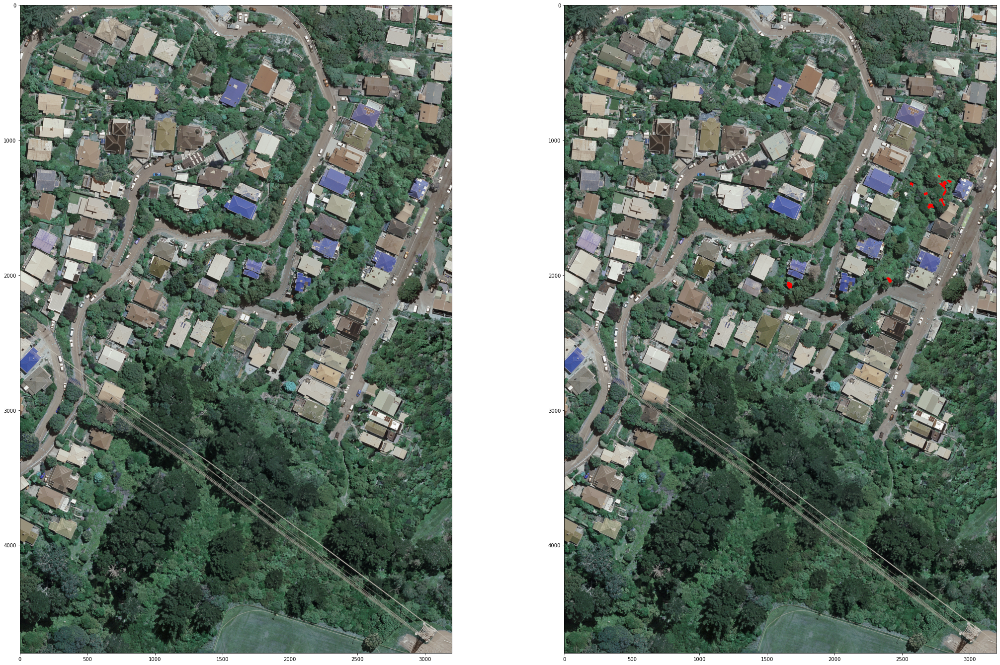

In [29]:
img = cv2.imread('/home/dennis/projects/wcc/images/BQ31_500_043066.jp2', cv2.IMREAD_COLOR)
fig, ax = plt.subplots(1, 2, figsize=(36,24))
ax[0].imshow(img)
ax[1].imshow(img)
with open('/home/dennis/projects/wcc/images/BQ31_500_043066.json') as f:
    labels = json.load(f)
shapes = labels['shapes']
for shape in shapes:
    points = shape['points']
    x, y = zip(*points)
    ax[1].fill(x, y, 'r')
fig.savefig('plot.png')
plt.show()

In [54]:
mask = np.zeros(img.shape[:-1], np.uint8)
for shape in shapes:
    points = np.array([shape['points']]).astype('int32')
    print(points.shape)
    cv2.fillPoly(mask, points, 255)

(1, 15, 2)
(1, 9, 2)
(1, 10, 2)
(1, 37, 2)
(1, 39, 2)
(1, 14, 2)
(1, 12, 2)
(1, 19, 2)
(1, 9, 2)
(1, 17, 2)


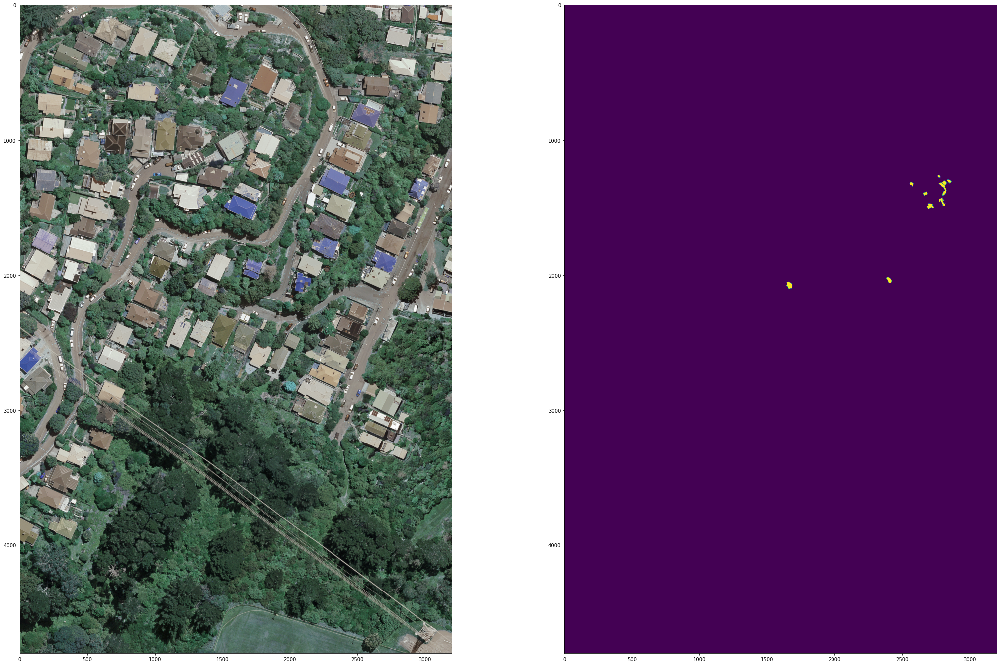

In [55]:
fig, ax = plt.subplots(1, 2, figsize=(36,24))
ax[0].imshow(img)
ax[1].imshow(mask)
fig.savefig('plotmask.png')
plt.show()

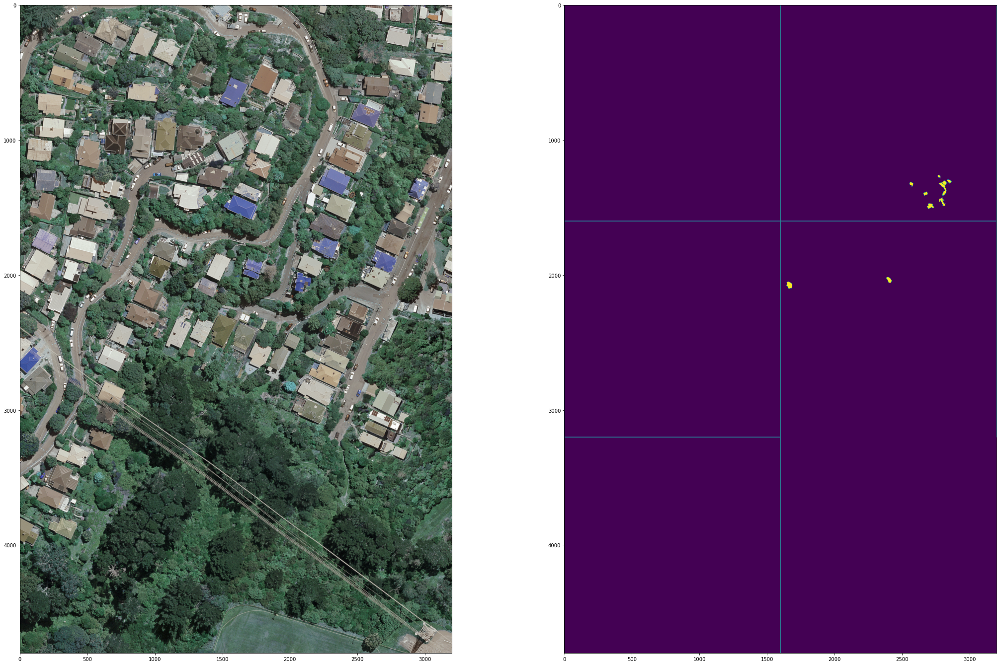

In [64]:
for x in range(1600, 1600, 1600):
    cv2.line(mask, (x,0), (x,4800), 128, 4)
for y in range(1600, 3200, 1600):
    cv2.line(mask, (0,y), (3200,y), 128, 4)
fig, ax = plt.subplots(1, 2, figsize=(36,24))
ax[0].imshow(img)
ax[1].imshow(mask)
fig.savefig('plotmask.png')
plt.show()

In [53]:
triangle = np.array([[(200, mask.shape[0]), (1000, mask.shape[1]), (550, 400)]])
print(triangle.shape)
cv2.fillPoly(mask, triangle, 255)

(1, 3, 2)


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)